In [59]:
#IMPORT all necessary libraries and modules

#add path to sys so that we can import functions from other folders
import sys
import os

sys.path.append(r'C:\Users\tfarotimi\United Nations\Contexto Proyecciones Sector Externo - ProyectoAutomatización\Dev\Inflation Forecasting\lib')

#import libraries 
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import plotly.offline as pyo
from plotly.subplots import make_subplots
pyo.init_notebook_mode()
import nbformat

import matplotlib.pyplot as plt
import seaborn as sns



#tqdm
from tqdm import tqdm

from monthly_forecast_run import run_monthly_forecast
from excel_agg_forecast import create_aggregate_report
from excel_forecast_report import create_forecast_report

from helper_functions import load_data
from helper_functions import grangers_causation_matrix
from helper_functions import cointegration_test
from helper_functions import adfuller_test
from helper_functions import invert_transformation
from helper_functions import forecast_accuracy
from helper_functions import get_best_predictors
from helper_functions import create_predictor_combinations
from helper_functions import run_var_for_all_combos

from models import var_model, arima




#import modules
import importlib
import models
import helper_functions
import dashboard
import residuals_analysis
import forecast
import armagarch as ag


#reload modules to ensure that changes made to them are reflected in the notebook
importlib.reload(models)
importlib.reload(helper_functions)
importlib.reload(dashboard)
importlib.reload(residuals_analysis)
importlib.reload(forecast)


%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from statsmodels.tsa.api import acf, graphics, pacf
from statsmodels.tsa.ar_model import AutoReg, ar_select_order
import datetime as dt

#import varmax from models
from models import varmax

import regex as re

sns.set_style("darkgrid")
pd.plotting.register_matplotlib_converters()
# Default figure size
sns.mpl.rc("figure", figsize=(16, 6))
sns.mpl.rc("font", size=14)

#ignore warnings
import warnings
warnings.filterwarnings('ignore')






In [60]:
pry = pd.read_excel(r"C:\Users\tfarotimi\United Nations\Contexto Proyecciones Sector Externo - ProyectoAutomatización\Dev\Inflation Forecasting\dat\2024\January\Banco de Paraguay Time Series.xlsx", sheet_name = 'Sheet4')
#SET INDEX TO PERIOD
pry.set_index('Period', inplace = True)

#pry = pry['2008-02-01':]

pry.tail()

,YoY Increase Inflation,Alimentación bebidas no alchoholicas,Bebidas alcohol tabacos,Prendas de vestir y calzado,"Alojamiento agua, electricidad gas y otros",Muebles y artículos para el hogar,Gasto en salud,Transporte,Comunicación,Recreación cultura,Educación,Restaurant hoteles,Bienes servicios
Period,,,,,,,,,,,,,
2023-10-01,3.534137,136.0,109.6,114.2,115.1,123.7,126.9,148.0,105.5,119.5,128.9,129.1,126.3
2023-11-01,3.189793,138.0,109.4,114.3,115.3,123.6,126.9,146.6,105.6,120.1,128.9,129.2,126.4
2023-12-01,3.674121,140.0,109.6,114.6,115.3,123.7,127.5,145.2,105.2,120.6,128.9,129.8,126.6
2024-01-01,3.393844,144.2,109.9,114.7,115.4,123.8,127.7,144.6,105.5,121.1,129.0,130.7,127.0
2024-02-01,2.906520,143.0,110.0,114.9,115.5,123.8,128.4,144.0,105.5,120.9,134.0,131.3,127.6


In [61]:
#get sheet names from pry2 file
sheet_names = pd.ExcelFile(r"C:\Users\tfarotimi\United Nations\Contexto Proyecciones Sector Externo - ProyectoAutomatización\Dev\Inflation Forecasting\dat\2024\January\Banco de Paraguay Time Series.xlsx").sheet_names

for sheet in sheet_names[1:]:
    
    # #READ SHEET 2 AND RESAMPLE, THEN MERGE WITH pry
    pry2 = pd.read_excel(r"C:\Users\tfarotimi\United Nations\Contexto Proyecciones Sector Externo - ProyectoAutomatización\Dev\Inflation Forecasting\dat\2024\January\Banco de Paraguay Time Series.xlsx", sheet_name = sheet)
    pry2.set_index('Period', inplace = True)


    if 'annual' in sheet:
       #resample to month start
        pry2 = pry2.resample('MS').ffill()
     

    pry = pd.merge(pry, pry2, how = 'left', left_index = True, right_index = True)


    # create_forecast_report({'MEX3' + sheet: mex3}, [], varmax, log_transform = False, walkforward = False)


In [62]:
pry

,YoY Increase Inflation,Alimentación bebidas no alchoholicas,Bebidas alcohol tabacos,Prendas de vestir y calzado,"Alojamiento agua, electricidad gas y otros",Muebles y artículos para el hogar,Gasto en salud,Transporte,Comunicación,Recreación cultura,...,PPI_Indice General,Reservas bancarias,M1 - Variacion Interanual,Exportaciones totales,Importaciones totales,Reservas Internacionales - Dolares,Tipo de Cambio (Real),Indice Salario Minimal - Nominal,Indice Salario Minimo - Real,Tasa de Politica Monetaria
Period,,,,,,,,,,,,,,,,,,,,,
1994-12-01,18.276942,16.968529,19.301812,41.603831,22.102536,23.311248,24.175633,19.258525,17.778163,26.986978,...,NaN,NaN,NaN,NaN,NaN,569.200000,NaN,1641.740313,112.246057,NaN
1995-01-01,16.860074,17.602769,18.756326,41.835331,22.394824,23.634566,24.515718,19.294908,17.778163,27.171190,...,NaN,NaN,NaN,3.877362e+05,3.010770e+05,475.500000,100.000000,1891.910265,114.067671,NaN
1995-02-01,14.576123,17.769127,18.756326,42.132974,22.506171,23.828557,24.988881,19.379800,17.778163,27.355401,...,NaN,NaN,NaN,3.660306e+05,3.003683e+05,461.400000,100.785793,1891.910265,114.067671,NaN
1995-03-01,14.345118,17.925088,18.896194,42.529830,23.216014,24.119544,25.314180,19.501076,17.778163,27.760667,...,NaN,NaN,NaN,4.361316e+05,3.743235e+05,473.600000,100.128716,1891.910265,114.067671,NaN
1995-04-01,13.965203,18.029062,19.036062,42.926687,23.243851,24.491360,25.550761,19.549586,17.778163,28.055405,...,NaN,NaN,NaN,4.064125e+05,3.303020e+05,564.000000,100.693832,1891.910265,114.067671,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-01,3.534137,136.000000,109.600000,114.200000,115.100000,123.700000,126.900000,148.000000,105.500000,119.500000,...,158.0,7.747504e+06,4.541729,1.592652e+06,1.496019e+06,9169.710777,106.349586,11852.889191,125.865758,7.75
2023-11-01,3.189793,138.000000,109.400000,114.300000,115.300000,123.600000,126.900000,146.600000,105.600000,120.100000,...,158.6,7.806186e+06,4.278603,1.435687e+06,1.373767e+06,8936.644952,109.594121,11852.889191,125.865758,7.25
2023-12-01,3.674121,140.000000,109.600000,114.600000,115.300000,123.700000,127.500000,145.200000,105.200000,120.600000,...,158.7,8.017791e+06,2.981292,1.431866e+06,1.480863e+06,9118.219293,106.880643,11852.889191,125.865758,6.75


<AxesSubplot: ylabel='Period'>

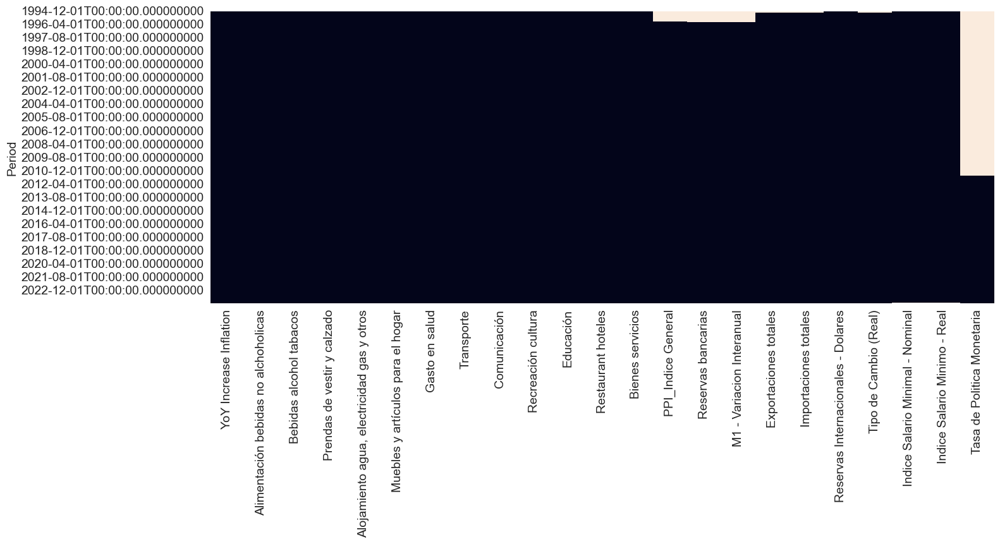

In [63]:
#show missing values as heatmap
sns.heatmap(pry.isnull(), cbar = False)


In [64]:
pry = pry.fillna(method='ffill')
pry = pry.dropna()


In [65]:
pry.columns

Index(['YoY Increase Inflation', 'Alimentación bebidas no alchoholicas',
       'Bebidas alcohol tabacos', 'Prendas de vestir y calzado',
       'Alojamiento agua, electricidad gas y otros',
       'Muebles y artículos para el hogar', 'Gasto en salud', 'Transporte',
       'Comunicación', 'Recreación cultura', 'Educación', 'Restaurant hoteles',
       'Bienes servicios', 'PPI_Indice General', 'Reservas bancarias',
       'M1 - Variacion Interanual', 'Exportaciones totales',
       'Importaciones totales', 'Reservas Internacionales - Dolares',
       'Tipo de Cambio (Real)', 'Indice Salario Minimal - Nominal',
       'Indice Salario Minimo - Real', 'Tasa de Politica Monetaria'],
      dtype='object')

In [66]:
causality_matrix = grangers_causation_matrix(pry, variables = pry.columns)
causality_matrix



data is not stationary YoY Increase Inflation YoY Increase Inflation
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series


differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - testing for granger causality with stationary series
differenced 1x - tes

,YoY Increase Inflation_x,Alimentación bebidas no alchoholicas_x,Bebidas alcohol tabacos_x,Prendas de vestir y calzado_x,"Alojamiento agua, electricidad gas y otros_x",Muebles y artículos para el hogar_x,Gasto en salud_x,Transporte_x,Comunicación_x,Recreación cultura_x,...,PPI_Indice General_x,Reservas bancarias_x,M1 - Variacion Interanual_x,Exportaciones totales_x,Importaciones totales_x,Reservas Internacionales - Dolares_x,Tipo de Cambio (Real)_x,Indice Salario Minimal - Nominal_x,Indice Salario Minimo - Real_x,Tasa de Politica Monetaria_x
YoY Increase Inflation_y,0.0,0.0009,0.0219,0.2938,0.6096,0.0063,0.2070,0.0206,0.0530,0.2877,...,0.0003,0.2557,0.0000,0.7056,0.3920,0.0001,0.0000,0.3790,0.0537,0.0073
Alimentación bebidas no alchoholicas_y,0.0,1.0000,0.0017,0.0435,0.1690,0.0240,0.1952,0.1104,0.0104,0.1391,...,0.0000,0.1422,0.0017,0.0201,0.0014,0.0001,0.0042,0.0213,0.3128,0.0022
Bebidas alcohol tabacos_y,0.0,0.0729,1.0000,0.0109,0.3951,0.0103,0.3536,0.0611,0.1428,0.0325,...,0.3462,0.1635,0.0049,0.0578,0.1398,0.3577,0.3367,0.3467,0.1089,0.0033
Prendas de vestir y calzado_y,0.0,0.0038,0.0986,1.0000,0.0001,0.0160,0.1221,0.0003,0.3867,0.0038,...,0.0001,0.7865,0.3023,0.0315,0.0943,0.0621,0.0385,0.0059,0.2562,0.0009
"Alojamiento agua, electricidad gas y otros_y",0.0,0.2782,0.4041,0.0778,1.0000,0.0010,0.1715,0.0000,0.5117,0.0804,...,0.0451,0.4867,0.2909,0.2463,0.0108,0.6883,0.0767,0.0106,0.4786,0.0734
Muebles y artículos para el hogar_y,0.0,0.0001,0.0115,0.0000,0.1383,1.0000,0.0492,0.0000,0.5198,0.1455,...,0.0001,0.3843,0.1055,0.0147,0.0456,0.0097,0.0028,0.0000,0.6485,0.0635
Gasto en salud_y,0.0,0.0154,0.2356,0.2035,0.1030,0.1710,1.0000,0.0916,0.6607,0.4018,...,0.1428,0.0345,0.0009,0.2093,0.0405,0.5282,0.0724,0.0048,0.3366,0.0050
Transporte_y,0.0,0.0055,0.0865,0.0001,0.0243,0.0114,0.2123,1.0000,0.8235,0.4074,...,0.0000,0.5941,0.1507,0.0666,0.4813,0.1510,0.0097,0.0532,0.5124,0.0565
Comunicación_y,0.0,0.0054,0.5879,0.1470,0.8132,0.3489,0.0173,0.0505,1.0000,0.2270,...,0.4906,0.2534,0.5212,0.5516,0.0732,0.1146,0.6459,0.1959,0.0729,0.9280
Recreación cultura_y,0.0,0.0720,0.3030,0.0037,0.0964,0.0370,0.2744,0.0039,0.5042,1.0000,...,0.0000,0.0192,0.1197,0.1683,0.0781,0.0479,0.0018,0.2401,0.6408,0.2977


In [67]:
final_predictors = get_best_predictors(causality_matrix)
final_predictors
#insert 'YoY Increase Inflation' as the first predictor
final_predictors

['YoY Increase Inflation_y',
 'Alimentación bebidas no alchoholicas_y',
 'Bebidas alcohol tabacos_y',
 'Prendas de vestir y calzado_y',
 'Alojamiento agua, electricidad gas y otros_y',
 'Muebles y artículos para el hogar_y',
 'Gasto en salud_y',
 'Transporte_y',
 'Comunicación_y',
 'Recreación cultura_y',
 'Educación_y',
 'Restaurant hoteles_y',
 'Bienes servicios_y',
 'PPI_Indice General_y',
 'Reservas bancarias_y',
 'M1 - Variacion Interanual_y',
 'Exportaciones totales_y',
 'Importaciones totales_y',
 'Reservas Internacionales - Dolares_y',
 'Tipo de Cambio (Real)_y',
 'Indice Salario Minimal - Nominal_y',
 'Indice Salario Minimo - Real_y',
 'Tasa de Politica Monetaria_y']

<AxesSubplot: >

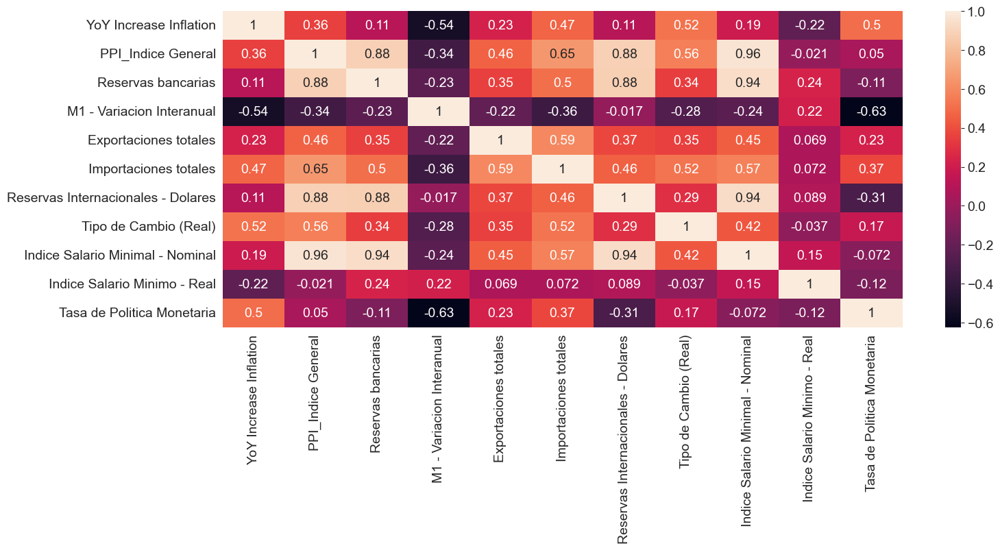

In [68]:

 

#remove _y from final predictors 
final_predictors = [re.sub('_y', '', x) for x in final_predictors]
components = ['Alimentación bebidas no alchoholicas_y',
 'Bebidas alcohol tabacos_y',
 'Prendas de vestir y calzado_y',
 'Alojamiento agua, electricidad gas y otros_y',
 'Muebles y artículos para el hogar_y',
 'Gasto en salud_y',
 'Transporte_y',
 'Comunicación_y',
 'Recreación cultura_y',
 'Educación_y',
 'Restaurant hoteles_y',
 'Bienes servicios_y']

components = [re.sub('_y', '', x) for x in components]

final_predictors = [f for f in final_predictors if f not in components]


#show heatmap of ppi_list 
sns.heatmap(pry[final_predictors].corr(), annot = True)


In [69]:
# #calculate VIF for ppi_list
# from tqdm import tqdm 

# ppi_list = ppi_list
# from statsmodels.stats.outliers_influence import variance_inflation_factor

# #create all possible combinations of ppi_list 
# ppi_combos = create_predictor_combinations(ppi_list)
# print(ppi_combos)

# # Create a DataFrame for VIF
# vif_data = []
# best_combos = pd.DataFrame()
# for combo in tqdm(ppi_combos):
#     vif_data = [variance_inflation_factor(pry[list(combo)].values, i)
#                        for i in range(len(combo))]
#     if max(vif_data) < 10:
#         best_combos = best_combos.append({'combo': combo, 'worst_vif': max(vif_data)}, ignore_index=True)
#         print (combo, vif_data)

# print(best_combos)





In [70]:
#remove first element from final_predictors
final_predictors = final_predictors[1:]

pry_breakdown_results = run_var_for_all_combos(pry, final_predictors)


1023


  0%|          | 2/1023 [00:00<00:58, 17.43it/s]

Lowest MAPE:  0.8032400120206084 Best Combination:  ('YoY Increase Inflation', 'PPI_Indice General')
Lowest MAPE:  0.7903109755142826 Best Combination:  ('YoY Increase Inflation', 'Reservas bancarias')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  0%|          | 4/1023 [00:00<00:58, 17.54it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  1%|          | 7/1023 [00:00<00:50, 20.01it/s]

Error on combination:  ('YoY Increase Inflation', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  1%|          | 9/1023 [00:00<00:56, 18.01it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  1%|          | 11/1023 [00:00<00:56, 17.87it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  1%|▏         | 13/1023 [00:00<00:58, 17.37it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  1%|▏         | 15/1023 [00:00<00:59, 16.90it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  2%|▏         | 17/1023 [00:01<01:05, 15.37it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  2%|▏         | 19/1023 [00:01<01:21, 12.26it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  2%|▏         | 21/1023 [00:01<01:21, 12.29it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  2%|▏         | 23/1023 [00:01<01:19, 12.58it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  2%|▏         | 25/1023 [00:01<01:18, 12.77it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  3%|▎         | 27/1023 [00:01<01:14, 13.41it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')


  3%|▎         | 31/1023 [00:02<01:07, 14.59it/s]

Lowest MAPE:  0.18319104114856888 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  3%|▎         | 35/1023 [00:02<01:05, 14.97it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  4%|▍         | 39/1023 [00:02<01:04, 15.31it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Error on combination:  ('YoY Increase Inflation', 'Exportaciones totales', 'Indice Salario Minimo - Real')


  4%|▍         | 43/1023 [00:02<01:02, 15.64it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Error on combination:  ('YoY Increase Inflation', 'Importaciones totales', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  5%|▍         | 47/1023 [00:03<00:59, 16.34it/s]

Error on combination:  ('YoY Increase Inflation', 'Importaciones totales', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Error on combination:  ('YoY Increase Inflation', 'Reservas Internacionales - Dolares', 'Tipo de Cambio (Real)')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  5%|▍         | 51/1023 [00:03<01:00, 16.16it/s]

Error on combination:  ('YoY Increase Inflation', 'Reservas Internacionales - Dolares', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  5%|▌         | 53/1023 [00:03<01:02, 15.60it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  6%|▌         | 57/1023 [00:03<01:08, 14.11it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  6%|▌         | 59/1023 [00:03<01:09, 13.79it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  6%|▌         | 63/1023 [00:04<01:13, 13.03it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  6%|▋         | 65/1023 [00:04<01:12, 13.25it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  7%|▋         | 69/1023 [00:04<01:15, 12.61it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  7%|▋         | 71/1023 [00:04<01:14, 12.81it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  7%|▋         | 75/1023 [00:05<01:15, 12.61it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  8%|▊         | 77/1023 [00:05<01:11, 13.19it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  8%|▊         | 81/1023 [00:05<01:14, 12.68it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  8%|▊         | 83/1023 [00:05<01:20, 11.74it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  9%|▊         | 87/1023 [00:06<01:19, 11.78it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  9%|▊         | 89/1023 [00:06<01:21, 11.49it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  9%|▉         | 93/1023 [00:06<01:19, 11.71it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


  9%|▉         | 95/1023 [00:06<01:14, 12.40it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 10%|▉         | 99/1023 [00:07<01:14, 12.38it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 10%|▉         | 101/1023 [00:07<01:13, 12.60it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 10%|█         | 105/1023 [00:07<01:12, 12.75it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 11%|█         | 109/1023 [00:08<01:15, 12.04it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 11%|█         | 111/1023 [00:08<01:18, 11.68it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 11%|█         | 115/1023 [00:08<01:17, 11.75it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 11%|█▏        | 117/1023 [00:08<01:16, 11.81it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 12%|█▏        | 121/1023 [00:09<01:17, 11.68it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 12%|█▏        | 123/1023 [00:09<01:20, 11.22it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Error on combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Indice Salario Minimo - Real')


 12%|█▏        | 127/1023 [00:09<01:12, 12.32it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 13%|█▎        | 129/1023 [00:09<01:15, 11.82it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')


 13%|█▎        | 133/1023 [00:10<01:13, 12.14it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Error on combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares', 'Indice Salario Minimo - Real')


 13%|█▎        | 135/1023 [00:10<01:18, 11.37it/s]

Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.14378755328581852 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 14%|█▎        | 139/1023 [00:10<01:20, 10.97it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 14%|█▍        | 141/1023 [00:10<01:15, 11.76it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'Exportaciones totales', 'Importaciones totales', 'Reservas Internacionales - Dolares')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 14%|█▍        | 145/1023 [00:11<01:12, 12.14it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'Exportaciones totales', 'Importaciones totales', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 14%|█▍        | 147/1023 [00:11<01:18, 11.17it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'Exportaciones totales', 'Reservas Internacionales - Dolares', 'Indice Salario Minimo - Real')


 15%|█▍        | 149/1023 [00:11<01:17, 11.22it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 15%|█▍        | 151/1023 [00:11<01:22, 10.59it/s]

Error on combination:  ('YoY Increase Inflation', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 15%|█▌        | 155/1023 [00:12<01:25, 10.15it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 15%|█▌        | 157/1023 [00:12<01:23, 10.31it/s]

Error on combination:  ('YoY Increase Inflation', 'Importaciones totales', 'Reservas Internacionales - Dolares', 'Tipo de Cambio (Real)')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'Importaciones totales', 'Reservas Internacionales - Dolares', 'Indice Salario Minimo - Real')


 16%|█▌        | 159/1023 [00:12<01:20, 10.67it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 16%|█▌        | 161/1023 [00:12<01:37,  8.87it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 16%|█▌        | 164/1023 [00:13<01:35,  8.98it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 16%|█▋        | 168/1023 [00:13<01:20, 10.56it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'Reservas Internacionales - Dolares', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 17%|█▋        | 170/1023 [00:13<01:22, 10.34it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 17%|█▋        | 174/1023 [00:13<01:19, 10.69it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 17%|█▋        | 176/1023 [00:14<01:19, 10.69it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 17%|█▋        | 178/1023 [00:14<01:18, 10.75it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 18%|█▊        | 182/1023 [00:14<01:25,  9.86it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 18%|█▊        | 184/1023 [00:14<01:22, 10.11it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 18%|█▊        | 187/1023 [00:15<01:24,  9.85it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 18%|█▊        | 189/1023 [00:15<01:20, 10.31it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 19%|█▉        | 192/1023 [00:15<01:24,  9.78it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 19%|█▉        | 195/1023 [00:16<01:31,  9.02it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 19%|█▉        | 196/1023 [00:16<01:30,  9.11it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 20%|█▉        | 200/1023 [00:16<01:29,  9.20it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 20%|█▉        | 202/1023 [00:17<01:42,  7.98it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 20%|██        | 205/1023 [00:17<01:29,  9.14it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 20%|██        | 207/1023 [00:17<01:32,  8.80it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 20%|██        | 209/1023 [00:17<01:25,  9.57it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 21%|██        | 212/1023 [00:18<01:35,  8.52it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 21%|██        | 214/1023 [00:18<01:37,  8.30it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 21%|██        | 216/1023 [00:18<01:49,  7.40it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 21%|██▏       | 218/1023 [00:18<01:49,  7.35it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 22%|██▏       | 220/1023 [00:19<01:54,  6.99it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 22%|██▏       | 222/1023 [00:19<01:52,  7.10it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 22%|██▏       | 224/1023 [00:19<01:57,  6.81it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 22%|██▏       | 226/1023 [00:20<01:57,  6.79it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 22%|██▏       | 227/1023 [00:20<02:04,  6.40it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 22%|██▏       | 229/1023 [00:20<02:24,  5.49it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 23%|██▎       | 231/1023 [00:20<02:10,  6.08it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 23%|██▎       | 233/1023 [00:21<01:49,  7.23it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 23%|██▎       | 235/1023 [00:21<01:45,  7.44it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 23%|██▎       | 237/1023 [00:21<01:43,  7.62it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 23%|██▎       | 240/1023 [00:22<01:32,  8.46it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 24%|██▎       | 242/1023 [00:22<01:30,  8.58it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 24%|██▍       | 245/1023 [00:22<01:25,  9.11it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 24%|██▍       | 248/1023 [00:22<01:25,  9.03it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 24%|██▍       | 250/1023 [00:23<01:28,  8.74it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 25%|██▍       | 252/1023 [00:23<01:22,  9.37it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 25%|██▍       | 254/1023 [00:23<01:34,  8.13it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 25%|██▌       | 256/1023 [00:23<01:35,  8.07it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 25%|██▌       | 257/1023 [00:24<01:38,  7.81it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 26%|██▌       | 261/1023 [00:24<01:25,  8.87it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 26%|██▌       | 263/1023 [00:24<01:26,  8.83it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 26%|██▌       | 267/1023 [00:25<01:17,  9.74it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 26%|██▋       | 270/1023 [00:25<01:16,  9.88it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 27%|██▋       | 272/1023 [00:25<01:19,  9.43it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 27%|██▋       | 273/1023 [00:25<01:19,  9.46it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 27%|██▋       | 277/1023 [00:26<01:18,  9.56it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 27%|██▋       | 279/1023 [00:26<01:24,  8.79it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 27%|██▋       | 281/1023 [00:26<01:18,  9.45it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 28%|██▊       | 285/1023 [00:26<01:16,  9.70it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 28%|██▊       | 287/1023 [00:27<01:17,  9.52it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 28%|██▊       | 289/1023 [00:27<01:13,  9.94it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 29%|██▊       | 292/1023 [00:27<01:12, 10.06it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 29%|██▊       | 294/1023 [00:27<01:22,  8.84it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 29%|██▉       | 296/1023 [00:28<01:17,  9.40it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 29%|██▉       | 299/1023 [00:28<01:15,  9.61it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 29%|██▉       | 301/1023 [00:28<01:17,  9.35it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 30%|██▉       | 304/1023 [00:29<01:21,  8.87it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 30%|██▉       | 306/1023 [00:29<01:19,  8.99it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 30%|███       | 309/1023 [00:29<01:18,  9.05it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 30%|███       | 310/1023 [00:29<01:21,  8.76it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 31%|███       | 313/1023 [00:30<01:31,  7.79it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 31%|███       | 315/1023 [00:30<01:33,  7.61it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 31%|███       | 317/1023 [00:30<01:24,  8.32it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 31%|███       | 319/1023 [00:30<01:42,  6.87it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Indice Salario Minimo - Real')


 31%|███▏      | 321/1023 [00:31<01:32,  7.60it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 32%|███▏      | 323/1023 [00:31<01:27,  8.03it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Reservas Internacionales - Dolares', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 32%|███▏      | 326/1023 [00:31<01:22,  8.48it/s]

Lowest MAPE:  0.10958974115077198 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 32%|███▏      | 329/1023 [00:32<01:23,  8.31it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 32%|███▏      | 331/1023 [00:32<01:18,  8.77it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 33%|███▎      | 334/1023 [00:32<01:15,  9.09it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Importaciones totales', 'Reservas Internacionales - Dolares', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 33%|███▎      | 336/1023 [00:32<01:18,  8.79it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 33%|███▎      | 338/1023 [00:33<01:20,  8.54it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 33%|███▎      | 339/1023 [00:33<01:23,  8.22it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 34%|███▎      | 343/1023 [00:33<01:13,  9.23it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Reservas Internacionales - Dolares', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 34%|███▎      | 345/1023 [00:33<01:19,  8.57it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 34%|███▍      | 347/1023 [00:34<01:18,  8.65it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 34%|███▍      | 349/1023 [00:34<01:17,  8.70it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 34%|███▍      | 351/1023 [00:34<01:21,  8.27it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 35%|███▍      | 354/1023 [00:34<01:14,  9.02it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'Exportaciones totales', 'Importaciones totales', 'Reservas Internacionales - Dolares', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 35%|███▍      | 357/1023 [00:35<01:11,  9.26it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 35%|███▌      | 359/1023 [00:35<01:16,  8.71it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 35%|███▌      | 361/1023 [00:35<01:16,  8.65it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 35%|███▌      | 363/1023 [00:36<01:30,  7.27it/s]

Error on combination:  ('YoY Increase Inflation', 'Exportaciones totales', 'Reservas Internacionales - Dolares', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 36%|███▌      | 364/1023 [00:36<01:53,  5.79it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 36%|███▌      | 365/1023 [00:36<02:26,  4.48it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 36%|███▌      | 366/1023 [00:37<02:53,  3.79it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 36%|███▌      | 367/1023 [00:37<03:36,  3.03it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 36%|███▌      | 368/1023 [00:38<04:18,  2.54it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 36%|███▌      | 369/1023 [00:38<03:44,  2.92it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 36%|███▌      | 370/1023 [00:38<03:29,  3.12it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 36%|███▋      | 371/1023 [00:38<03:12,  3.38it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 36%|███▋      | 372/1023 [00:39<02:59,  3.63it/s]

Error on combination:  ('YoY Increase Inflation', 'Importaciones totales', 'Reservas Internacionales - Dolares', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 36%|███▋      | 373/1023 [00:39<02:49,  3.85it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 37%|███▋      | 374/1023 [00:39<02:46,  3.90it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 37%|███▋      | 376/1023 [00:39<02:17,  4.71it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 37%|███▋      | 378/1023 [00:40<02:07,  5.05it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 37%|███▋      | 380/1023 [00:40<01:56,  5.50it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 37%|███▋      | 382/1023 [00:41<01:51,  5.73it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 38%|███▊      | 384/1023 [00:41<01:39,  6.42it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 38%|███▊      | 386/1023 [00:41<01:36,  6.58it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 38%|███▊      | 388/1023 [00:41<01:39,  6.37it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 38%|███▊      | 390/1023 [00:42<01:42,  6.16it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 38%|███▊      | 391/1023 [00:42<01:40,  6.30it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 38%|███▊      | 393/1023 [00:42<01:56,  5.41it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 39%|███▊      | 395/1023 [00:43<01:52,  5.60it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 39%|███▉      | 397/1023 [00:43<01:38,  6.38it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 39%|███▉      | 399/1023 [00:43<01:36,  6.46it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 39%|███▉      | 401/1023 [00:44<01:43,  6.03it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 39%|███▉      | 403/1023 [00:44<01:36,  6.40it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 39%|███▉      | 404/1023 [00:44<01:40,  6.13it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 40%|███▉      | 407/1023 [00:45<01:36,  6.40it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 40%|███▉      | 409/1023 [00:45<01:39,  6.18it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 40%|████      | 411/1023 [00:45<01:29,  6.80it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 40%|████      | 412/1023 [00:45<01:30,  6.75it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 40%|████      | 414/1023 [00:46<01:54,  5.32it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 41%|████      | 416/1023 [00:46<01:54,  5.30it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 41%|████      | 418/1023 [00:46<01:41,  5.94it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 41%|████      | 420/1023 [00:47<01:46,  5.67it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 41%|████▏     | 422/1023 [00:47<01:35,  6.26it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 41%|████▏     | 424/1023 [00:47<01:32,  6.45it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 42%|████▏     | 426/1023 [00:48<01:34,  6.34it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 42%|████▏     | 428/1023 [00:48<01:28,  6.71it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 42%|████▏     | 430/1023 [00:48<01:44,  5.67it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 42%|████▏     | 432/1023 [00:49<01:41,  5.85it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 42%|████▏     | 434/1023 [00:49<01:30,  6.52it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 43%|████▎     | 435/1023 [00:49<01:56,  5.06it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 43%|████▎     | 437/1023 [00:50<01:49,  5.35it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 43%|████▎     | 439/1023 [00:50<01:52,  5.20it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 43%|████▎     | 441/1023 [00:50<01:50,  5.27it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 43%|████▎     | 443/1023 [00:51<01:38,  5.91it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 43%|████▎     | 445/1023 [00:51<01:34,  6.15it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 44%|████▎     | 447/1023 [00:51<01:26,  6.65it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 44%|████▍     | 449/1023 [00:52<01:27,  6.59it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 44%|████▍     | 451/1023 [00:52<01:30,  6.34it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 44%|████▍     | 453/1023 [00:52<01:23,  6.85it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 44%|████▍     | 455/1023 [00:53<01:39,  5.69it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 45%|████▍     | 457/1023 [00:53<01:31,  6.22it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 45%|████▍     | 459/1023 [00:53<01:53,  4.99it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 45%|████▌     | 461/1023 [00:54<01:47,  5.21it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 45%|████▌     | 463/1023 [00:54<01:33,  6.00it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 45%|████▌     | 465/1023 [00:54<01:39,  5.60it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 46%|████▌     | 467/1023 [00:55<01:40,  5.51it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 46%|████▌     | 469/1023 [00:55<01:30,  6.14it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 46%|████▌     | 471/1023 [00:56<01:36,  5.73it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 46%|████▌     | 473/1023 [00:56<01:32,  5.93it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 46%|████▋     | 475/1023 [00:56<01:29,  6.15it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 47%|████▋     | 476/1023 [00:56<01:33,  5.84it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 47%|████▋     | 477/1023 [00:57<01:49,  4.98it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 47%|████▋     | 479/1023 [00:57<01:46,  5.12it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 47%|████▋     | 481/1023 [00:57<01:42,  5.28it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 47%|████▋     | 483/1023 [00:58<01:30,  5.96it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 47%|████▋     | 485/1023 [00:58<01:35,  5.66it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 48%|████▊     | 487/1023 [00:58<01:33,  5.76it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 48%|████▊     | 489/1023 [00:59<01:23,  6.40it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 48%|████▊     | 491/1023 [00:59<01:29,  5.96it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 48%|████▊     | 493/1023 [00:59<01:31,  5.80it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 48%|████▊     | 495/1023 [01:00<01:27,  6.01it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 49%|████▊     | 497/1023 [01:00<01:31,  5.75it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 49%|████▉     | 499/1023 [01:00<01:39,  5.28it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 49%|████▉     | 500/1023 [01:01<01:38,  5.32it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 49%|████▉     | 502/1023 [01:01<01:31,  5.72it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 49%|████▉     | 503/1023 [01:01<01:34,  5.50it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 49%|████▉     | 506/1023 [01:02<01:33,  5.54it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 50%|████▉     | 508/1023 [01:02<01:35,  5.42it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 50%|████▉     | 510/1023 [01:02<01:30,  5.67it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 50%|█████     | 512/1023 [01:03<01:24,  6.04it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 50%|█████     | 514/1023 [01:03<01:24,  6.03it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 50%|█████     | 516/1023 [01:03<01:16,  6.67it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 51%|█████     | 518/1023 [01:04<01:20,  6.27it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 51%|█████     | 519/1023 [01:04<01:21,  6.19it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 51%|█████     | 520/1023 [01:04<01:35,  5.27it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 51%|█████     | 522/1023 [01:05<01:38,  5.09it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 51%|█████     | 524/1023 [01:05<01:33,  5.34it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 51%|█████▏    | 526/1023 [01:05<01:25,  5.78it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 52%|█████▏    | 528/1023 [01:06<01:25,  5.78it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 52%|█████▏    | 530/1023 [01:06<01:15,  6.52it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 52%|█████▏    | 532/1023 [01:06<01:24,  5.84it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 52%|█████▏    | 534/1023 [01:07<01:23,  5.85it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 52%|█████▏    | 536/1023 [01:07<01:21,  6.00it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 53%|█████▎    | 538/1023 [01:07<01:16,  6.37it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 53%|█████▎    | 540/1023 [01:07<01:19,  6.11it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 53%|█████▎    | 542/1023 [01:08<01:32,  5.19it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 53%|█████▎    | 544/1023 [01:08<01:37,  4.90it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 53%|█████▎    | 546/1023 [01:09<01:34,  5.05it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 54%|█████▎    | 548/1023 [01:09<01:28,  5.39it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 54%|█████▍    | 550/1023 [01:09<01:19,  5.94it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 54%|█████▍    | 552/1023 [01:10<01:15,  6.27it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 54%|█████▍    | 554/1023 [01:10<01:17,  6.05it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 54%|█████▍    | 556/1023 [01:10<01:15,  6.20it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 55%|█████▍    | 558/1023 [01:11<01:17,  6.00it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 55%|█████▍    | 560/1023 [01:11<01:19,  5.84it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 55%|█████▍    | 561/1023 [01:11<01:26,  5.34it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 55%|█████▍    | 562/1023 [01:12<01:37,  4.72it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 55%|█████▌    | 564/1023 [01:12<01:46,  4.32it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 55%|█████▌    | 565/1023 [01:12<01:40,  4.55it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 55%|█████▌    | 566/1023 [01:13<01:40,  4.54it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 56%|█████▌    | 568/1023 [01:13<01:34,  4.80it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 56%|█████▌    | 570/1023 [01:13<01:25,  5.31it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 56%|█████▌    | 572/1023 [01:14<01:16,  5.91it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 56%|█████▌    | 574/1023 [01:14<01:16,  5.89it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 56%|█████▋    | 576/1023 [01:14<01:08,  6.52it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 57%|█████▋    | 578/1023 [01:15<01:12,  6.11it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 57%|█████▋    | 580/1023 [01:15<01:08,  6.44it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 57%|█████▋    | 582/1023 [01:15<01:07,  6.52it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 57%|█████▋    | 584/1023 [01:15<01:04,  6.80it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Reservas Internacionales - Dolares', 'Indice Salario Minimo - Real')


 57%|█████▋    | 586/1023 [01:16<01:05,  6.71it/s]

Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09322185578459193 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 57%|█████▋    | 588/1023 [01:16<00:57,  7.51it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 58%|█████▊    | 590/1023 [01:16<01:04,  6.70it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 58%|█████▊    | 591/1023 [01:16<01:01,  7.00it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 58%|█████▊    | 593/1023 [01:17<01:12,  5.89it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Error on combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Reservas Internacionales - Dolares', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 58%|█████▊    | 595/1023 [01:17<01:10,  6.07it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 58%|█████▊    | 597/1023 [01:17<01:08,  6.25it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 59%|█████▊    | 599/1023 [01:18<01:11,  5.90it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 59%|█████▊    | 601/1023 [01:18<01:06,  6.34it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 59%|█████▉    | 603/1023 [01:18<01:01,  6.82it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 59%|█████▉    | 605/1023 [01:19<01:02,  6.70it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 59%|█████▉    | 607/1023 [01:19<00:59,  7.00it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 60%|█████▉    | 609/1023 [01:19<01:04,  6.47it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 60%|█████▉    | 611/1023 [01:20<01:04,  6.37it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 60%|█████▉    | 613/1023 [01:20<01:05,  6.30it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 60%|██████    | 615/1023 [01:20<01:03,  6.42it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 60%|██████    | 617/1023 [01:21<01:03,  6.41it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 61%|██████    | 619/1023 [01:21<00:54,  7.42it/s]

Error on combination:  ('YoY Increase Inflation', 'Exportaciones totales', 'Importaciones totales', 'Reservas Internacionales - Dolares', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 61%|██████    | 620/1023 [01:21<00:57,  7.05it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 61%|██████    | 622/1023 [01:21<01:07,  5.94it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 61%|██████    | 624/1023 [01:22<01:11,  5.57it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 61%|██████    | 626/1023 [01:22<01:07,  5.91it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 61%|██████▏   | 628/1023 [01:22<01:06,  5.91it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 62%|██████▏   | 630/1023 [01:23<01:02,  6.27it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 62%|██████▏   | 632/1023 [01:23<01:04,  6.08it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 62%|██████▏   | 634/1023 [01:23<00:57,  6.72it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 62%|██████▏   | 636/1023 [01:24<00:58,  6.64it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 62%|██████▏   | 638/1023 [01:24<01:01,  6.28it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 63%|██████▎   | 640/1023 [01:24<01:03,  6.04it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 63%|██████▎   | 642/1023 [01:25<01:00,  6.30it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 63%|██████▎   | 644/1023 [01:25<01:03,  5.93it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 63%|██████▎   | 646/1023 [01:25<00:57,  6.55it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 63%|██████▎   | 648/1023 [01:26<00:58,  6.40it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 63%|██████▎   | 649/1023 [01:26<00:57,  6.50it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 64%|██████▎   | 650/1023 [01:26<01:18,  4.73it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 64%|██████▎   | 652/1023 [01:26<01:16,  4.85it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 64%|██████▍   | 653/1023 [01:27<01:11,  5.17it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 64%|██████▍   | 655/1023 [01:27<01:06,  5.56it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 64%|██████▍   | 657/1023 [01:27<01:04,  5.63it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 64%|██████▍   | 659/1023 [01:28<00:57,  6.31it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 65%|██████▍   | 661/1023 [01:28<01:03,  5.71it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 65%|██████▍   | 663/1023 [01:28<01:03,  5.63it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 65%|██████▌   | 665/1023 [01:29<00:58,  6.13it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 65%|██████▌   | 667/1023 [01:29<01:02,  5.69it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 65%|██████▌   | 669/1023 [01:29<01:00,  5.80it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 66%|██████▌   | 671/1023 [01:30<00:59,  5.91it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 66%|██████▌   | 673/1023 [01:30<00:57,  6.05it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 66%|██████▌   | 675/1023 [01:30<00:57,  6.09it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 66%|██████▌   | 676/1023 [01:30<00:56,  6.20it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 66%|██████▋   | 678/1023 [01:31<01:11,  4.81it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 66%|██████▋   | 679/1023 [01:31<01:06,  5.17it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 67%|██████▋   | 681/1023 [01:32<01:08,  5.02it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 67%|██████▋   | 683/1023 [01:32<01:04,  5.28it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 67%|██████▋   | 685/1023 [01:32<00:58,  5.79it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 67%|██████▋   | 686/1023 [01:32<01:02,  5.38it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 67%|██████▋   | 688/1023 [01:33<01:00,  5.50it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 67%|██████▋   | 689/1023 [01:33<01:04,  5.15it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 68%|██████▊   | 691/1023 [01:33<01:02,  5.31it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 68%|██████▊   | 693/1023 [01:34<01:04,  5.09it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 68%|██████▊   | 695/1023 [01:34<00:57,  5.74it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 68%|██████▊   | 697/1023 [01:35<01:02,  5.18it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 68%|██████▊   | 699/1023 [01:35<01:00,  5.36it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 69%|██████▊   | 701/1023 [01:35<01:01,  5.26it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 69%|██████▊   | 702/1023 [01:36<01:04,  5.01it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 69%|██████▊   | 703/1023 [01:36<01:04,  4.96it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 69%|██████▉   | 705/1023 [01:36<01:08,  4.63it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 69%|██████▉   | 706/1023 [01:36<01:10,  4.50it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 69%|██████▉   | 708/1023 [01:37<01:02,  5.03it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 69%|██████▉   | 710/1023 [01:37<00:57,  5.48it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 70%|██████▉   | 711/1023 [01:37<00:55,  5.62it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 70%|██████▉   | 713/1023 [01:38<00:55,  5.60it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 70%|██████▉   | 715/1023 [01:38<00:56,  5.44it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 70%|███████   | 717/1023 [01:38<00:54,  5.64it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 70%|███████   | 719/1023 [01:39<00:52,  5.81it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 70%|███████   | 721/1023 [01:39<00:51,  5.85it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 71%|███████   | 723/1023 [01:39<00:49,  6.01it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 71%|███████   | 725/1023 [01:40<00:56,  5.30it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 71%|███████   | 727/1023 [01:40<00:53,  5.58it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 71%|███████▏  | 729/1023 [01:41<00:50,  5.82it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 71%|███████▏  | 730/1023 [01:41<00:48,  6.09it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 71%|███████▏  | 731/1023 [01:41<01:05,  4.48it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 72%|███████▏  | 733/1023 [01:41<00:58,  4.95it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 72%|███████▏  | 734/1023 [01:42<00:58,  4.91it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 72%|███████▏  | 736/1023 [01:42<01:00,  4.72it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 72%|███████▏  | 737/1023 [01:42<01:06,  4.30it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 72%|███████▏  | 738/1023 [01:43<01:10,  4.07it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 72%|███████▏  | 739/1023 [01:43<01:10,  4.02it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 72%|███████▏  | 740/1023 [01:43<01:08,  4.15it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 72%|███████▏  | 741/1023 [01:43<01:11,  3.96it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 73%|███████▎  | 743/1023 [01:44<01:05,  4.29it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 73%|███████▎  | 745/1023 [01:44<00:54,  5.07it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 73%|███████▎  | 747/1023 [01:45<00:55,  4.95it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 73%|███████▎  | 748/1023 [01:45<00:51,  5.30it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 73%|███████▎  | 750/1023 [01:45<00:52,  5.19it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 74%|███████▎  | 752/1023 [01:45<00:48,  5.60it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 74%|███████▎  | 753/1023 [01:46<00:49,  5.46it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 74%|███████▍  | 755/1023 [01:46<00:54,  4.93it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 74%|███████▍  | 756/1023 [01:46<00:57,  4.68it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 74%|███████▍  | 757/1023 [01:47<00:59,  4.46it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 74%|███████▍  | 758/1023 [01:47<00:59,  4.43it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 74%|███████▍  | 760/1023 [01:47<00:57,  4.58it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 74%|███████▍  | 761/1023 [01:48<01:02,  4.16it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 74%|███████▍  | 762/1023 [01:48<01:18,  3.32it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 75%|███████▍  | 763/1023 [01:48<01:29,  2.89it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 75%|███████▍  | 764/1023 [01:49<01:22,  3.12it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 75%|███████▍  | 766/1023 [01:49<01:09,  3.71it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 75%|███████▍  | 767/1023 [01:49<01:01,  4.14it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 75%|███████▌  | 769/1023 [01:50<00:53,  4.74it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 75%|███████▌  | 770/1023 [01:50<00:48,  5.18it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 76%|███████▌  | 773/1023 [01:50<00:43,  5.69it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 76%|███████▌  | 775/1023 [01:51<00:43,  5.71it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 76%|███████▌  | 776/1023 [01:51<00:51,  4.82it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 76%|███████▌  | 777/1023 [01:51<00:54,  4.49it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 76%|███████▌  | 779/1023 [01:52<00:50,  4.84it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 76%|███████▋  | 781/1023 [01:52<00:50,  4.83it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 76%|███████▋  | 782/1023 [01:52<00:46,  5.19it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 77%|███████▋  | 785/1023 [01:53<00:43,  5.44it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 77%|███████▋  | 786/1023 [01:53<00:41,  5.73it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 77%|███████▋  | 787/1023 [01:53<00:44,  5.35it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 77%|███████▋  | 789/1023 [01:54<00:45,  5.15it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 77%|███████▋  | 790/1023 [01:54<00:46,  4.98it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 78%|███████▊  | 793/1023 [01:54<00:44,  5.21it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 78%|███████▊  | 795/1023 [01:55<00:43,  5.20it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 78%|███████▊  | 796/1023 [01:55<00:49,  4.59it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 78%|███████▊  | 797/1023 [01:55<00:49,  4.54it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 78%|███████▊  | 798/1023 [01:55<00:49,  4.55it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 78%|███████▊  | 800/1023 [01:56<00:44,  4.97it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 78%|███████▊  | 802/1023 [01:56<00:41,  5.27it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 79%|███████▊  | 804/1023 [01:57<00:39,  5.57it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 79%|███████▉  | 806/1023 [01:57<00:40,  5.33it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 79%|███████▉  | 808/1023 [01:57<00:38,  5.63it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 79%|███████▉  | 810/1023 [01:58<00:39,  5.37it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 79%|███████▉  | 812/1023 [01:58<00:39,  5.34it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 79%|███████▉  | 813/1023 [01:58<00:39,  5.29it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 80%|███████▉  | 815/1023 [01:59<00:48,  4.27it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 80%|███████▉  | 817/1023 [01:59<00:42,  4.86it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 80%|████████  | 819/1023 [02:00<00:40,  5.05it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 80%|████████  | 821/1023 [02:00<00:37,  5.44it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 80%|████████  | 823/1023 [02:00<00:36,  5.49it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 81%|████████  | 825/1023 [02:01<00:34,  5.71it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 81%|████████  | 827/1023 [02:01<00:35,  5.53it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 81%|████████  | 829/1023 [02:01<00:34,  5.70it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 81%|████████  | 831/1023 [02:02<00:35,  5.43it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 81%|████████▏ | 832/1023 [02:02<00:32,  5.82it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 81%|████████▏ | 833/1023 [02:02<00:42,  4.47it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 82%|████████▏ | 834/1023 [02:02<00:42,  4.43it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 82%|████████▏ | 835/1023 [02:03<00:42,  4.42it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 82%|████████▏ | 837/1023 [02:03<00:36,  5.04it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 82%|████████▏ | 839/1023 [02:03<00:37,  4.95it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 82%|████████▏ | 841/1023 [02:04<00:35,  5.14it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 82%|████████▏ | 843/1023 [02:04<00:32,  5.57it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 83%|████████▎ | 844/1023 [02:04<00:33,  5.29it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 83%|████████▎ | 845/1023 [02:05<00:37,  4.70it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 83%|████████▎ | 847/1023 [02:05<00:37,  4.75it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 83%|████████▎ | 848/1023 [02:05<00:41,  4.23it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 83%|████████▎ | 850/1023 [02:06<00:38,  4.44it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 83%|████████▎ | 851/1023 [02:06<00:37,  4.62it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 83%|████████▎ | 853/1023 [02:06<00:36,  4.69it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 83%|████████▎ | 854/1023 [02:07<00:35,  4.82it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 84%|████████▎ | 855/1023 [02:07<00:37,  4.48it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 84%|████████▍ | 857/1023 [02:07<00:35,  4.69it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 84%|████████▍ | 859/1023 [02:08<00:33,  4.94it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 84%|████████▍ | 860/1023 [02:08<00:31,  5.19it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 84%|████████▍ | 861/1023 [02:08<00:32,  4.95it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 84%|████████▍ | 863/1023 [02:09<00:37,  4.22it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 84%|████████▍ | 864/1023 [02:09<00:40,  3.88it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 85%|████████▍ | 866/1023 [02:09<00:38,  4.03it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 85%|████████▍ | 867/1023 [02:10<00:38,  4.03it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 85%|████████▍ | 869/1023 [02:10<00:34,  4.42it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 85%|████████▌ | 870/1023 [02:10<00:31,  4.79it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 85%|████████▌ | 871/1023 [02:10<00:33,  4.59it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 85%|████████▌ | 873/1023 [02:11<00:30,  4.84it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 85%|████████▌ | 874/1023 [02:11<00:35,  4.19it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 86%|████████▌ | 876/1023 [02:12<00:33,  4.40it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 86%|████████▌ | 877/1023 [02:12<00:34,  4.19it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 86%|████████▌ | 878/1023 [02:12<00:36,  3.92it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 86%|████████▌ | 879/1023 [02:12<00:38,  3.75it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 86%|████████▌ | 880/1023 [02:13<00:40,  3.50it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 86%|████████▌ | 881/1023 [02:13<00:39,  3.58it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 86%|████████▌ | 882/1023 [02:13<00:39,  3.60it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 86%|████████▋ | 884/1023 [02:14<00:34,  4.04it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 87%|████████▋ | 885/1023 [02:14<00:31,  4.41it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 87%|████████▋ | 886/1023 [02:14<00:31,  4.38it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 87%|████████▋ | 888/1023 [02:15<00:29,  4.61it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 87%|████████▋ | 889/1023 [02:15<00:29,  4.55it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 87%|████████▋ | 891/1023 [02:15<00:27,  4.84it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 87%|████████▋ | 892/1023 [02:16<00:34,  3.77it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 87%|████████▋ | 893/1023 [02:16<00:34,  3.75it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 87%|████████▋ | 895/1023 [02:16<00:30,  4.23it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 88%|████████▊ | 896/1023 [02:17<00:31,  4.05it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 88%|████████▊ | 897/1023 [02:17<00:31,  3.98it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 88%|████████▊ | 898/1023 [02:17<00:32,  3.87it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 88%|████████▊ | 900/1023 [02:18<00:30,  4.00it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 88%|████████▊ | 901/1023 [02:18<00:32,  3.76it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 88%|████████▊ | 902/1023 [02:18<00:32,  3.75it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 88%|████████▊ | 903/1023 [02:19<00:31,  3.81it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 88%|████████▊ | 905/1023 [02:19<00:31,  3.80it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 89%|████████▊ | 906/1023 [02:19<00:28,  4.16it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 89%|████████▊ | 907/1023 [02:19<00:27,  4.15it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 89%|████████▉ | 909/1023 [02:20<00:24,  4.61it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 89%|████████▉ | 910/1023 [02:20<00:24,  4.54it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 89%|████████▉ | 912/1023 [02:21<00:23,  4.63it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 89%|████████▉ | 913/1023 [02:21<00:24,  4.49it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 89%|████████▉ | 914/1023 [02:21<00:24,  4.41it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 90%|████████▉ | 916/1023 [02:21<00:22,  4.73it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 90%|████████▉ | 917/1023 [02:22<00:22,  4.62it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 90%|████████▉ | 918/1023 [02:22<00:28,  3.75it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 90%|████████▉ | 919/1023 [02:22<00:27,  3.77it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 90%|█████████ | 921/1023 [02:23<00:24,  4.09it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 90%|█████████ | 922/1023 [02:23<00:24,  4.14it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 90%|█████████ | 923/1023 [02:23<00:23,  4.18it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 90%|█████████ | 924/1023 [02:23<00:23,  4.17it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 90%|█████████ | 925/1023 [02:24<00:23,  4.25it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 91%|█████████ | 927/1023 [02:24<00:20,  4.76it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 91%|█████████ | 928/1023 [02:24<00:20,  4.71it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 91%|█████████ | 929/1023 [02:25<00:20,  4.65it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 91%|█████████ | 930/1023 [02:25<00:24,  3.77it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 91%|█████████ | 931/1023 [02:25<00:24,  3.74it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 91%|█████████ | 933/1023 [02:26<00:21,  4.22it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 91%|█████████▏| 934/1023 [02:26<00:19,  4.54it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 91%|█████████▏| 935/1023 [02:26<00:19,  4.47it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 92%|█████████▏| 937/1023 [02:26<00:18,  4.71it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 92%|█████████▏| 938/1023 [02:27<00:18,  4.55it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 92%|█████████▏| 940/1023 [02:27<00:17,  4.75it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 92%|█████████▏| 941/1023 [02:27<00:18,  4.55it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 92%|█████████▏| 942/1023 [02:28<00:19,  4.23it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 92%|█████████▏| 943/1023 [02:28<00:23,  3.45it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 92%|█████████▏| 944/1023 [02:28<00:21,  3.76it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 92%|█████████▏| 945/1023 [02:29<00:23,  3.38it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 92%|█████████▏| 946/1023 [02:29<00:21,  3.55it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 93%|█████████▎| 947/1023 [02:29<00:20,  3.68it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 93%|█████████▎| 949/1023 [02:30<00:18,  4.06it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 93%|█████████▎| 950/1023 [02:30<00:17,  4.14it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 93%|█████████▎| 951/1023 [02:30<00:17,  4.21it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 93%|█████████▎| 952/1023 [02:30<00:16,  4.27it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 93%|█████████▎| 953/1023 [02:30<00:16,  4.33it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 93%|█████████▎| 955/1023 [02:31<00:14,  4.82it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 93%|█████████▎| 956/1023 [02:31<00:14,  4.76it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 94%|█████████▎| 957/1023 [02:31<00:17,  3.81it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 94%|█████████▎| 958/1023 [02:32<00:17,  3.66it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 94%|█████████▎| 959/1023 [02:32<00:16,  3.77it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 94%|█████████▍| 960/1023 [02:32<00:16,  3.87it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 94%|█████████▍| 962/1023 [02:33<00:14,  4.32it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 94%|█████████▍| 963/1023 [02:33<00:13,  4.33it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 94%|█████████▍| 965/1023 [02:33<00:13,  4.40it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 94%|█████████▍| 966/1023 [02:34<00:12,  4.40it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 95%|█████████▍| 967/1023 [02:34<00:13,  4.22it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 95%|█████████▍| 968/1023 [02:34<00:13,  4.08it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 95%|█████████▍| 969/1023 [02:34<00:14,  3.64it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 95%|█████████▍| 970/1023 [02:35<00:13,  3.79it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 95%|█████████▍| 971/1023 [02:35<00:14,  3.67it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 95%|█████████▌| 973/1023 [02:35<00:12,  3.99it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 95%|█████████▌| 974/1023 [02:36<00:12,  3.95it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 95%|█████████▌| 975/1023 [02:36<00:12,  3.76it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 95%|█████████▌| 976/1023 [02:36<00:11,  3.94it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▌| 977/1023 [02:36<00:12,  3.80it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▌| 978/1023 [02:37<00:12,  3.71it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▌| 979/1023 [02:37<00:12,  3.45it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▌| 980/1023 [02:37<00:12,  3.47it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▌| 981/1023 [02:38<00:12,  3.44it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▌| 982/1023 [02:38<00:11,  3.46it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▌| 983/1023 [02:38<00:11,  3.49it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▌| 984/1023 [02:39<00:11,  3.42it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▋| 985/1023 [02:39<00:10,  3.72it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▋| 986/1023 [02:39<00:10,  3.69it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 96%|█████████▋| 987/1023 [02:39<00:09,  3.71it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 97%|█████████▋| 988/1023 [02:40<00:09,  3.72it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 97%|█████████▋| 989/1023 [02:40<00:10,  3.23it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 97%|█████████▋| 990/1023 [02:40<00:09,  3.33it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 97%|█████████▋| 991/1023 [02:41<00:08,  3.56it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 97%|█████████▋| 992/1023 [02:41<00:08,  3.53it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 97%|█████████▋| 993/1023 [02:41<00:08,  3.57it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 97%|█████████▋| 994/1023 [02:41<00:07,  3.64it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 97%|█████████▋| 995/1023 [02:42<00:07,  3.66it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 97%|█████████▋| 996/1023 [02:42<00:07,  3.62it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 98%|█████████▊| 998/1023 [02:42<00:06,  3.94it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 98%|█████████▊| 999/1023 [02:43<00:07,  3.14it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 98%|█████████▊| 1000/1023 [02:43<00:07,  3.14it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 98%|█████████▊| 1001/1023 [02:43<00:06,  3.28it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 98%|█████████▊| 1002/1023 [02:44<00:06,  3.38it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 98%|█████████▊| 1003/1023 [02:44<00:05,  3.48it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 98%|█████████▊| 1004/1023 [02:44<00:05,  3.56it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 98%|█████████▊| 1006/1023 [02:45<00:04,  4.00it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')
Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 98%|█████████▊| 1007/1023 [02:45<00:04,  3.90it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 99%|█████████▊| 1008/1023 [02:45<00:04,  3.74it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 99%|█████████▊| 1009/1023 [02:46<00:04,  3.22it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 99%|█████████▊| 1010/1023 [02:46<00:03,  3.28it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 99%|█████████▉| 1011/1023 [02:46<00:03,  3.36it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 99%|█████████▉| 1012/1023 [02:46<00:03,  3.46it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 99%|█████████▉| 1013/1023 [02:47<00:02,  3.48it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 99%|█████████▉| 1014/1023 [02:47<00:02,  3.54it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 99%|█████████▉| 1015/1023 [02:47<00:02,  3.79it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 99%|█████████▉| 1016/1023 [02:48<00:01,  3.67it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


 99%|█████████▉| 1017/1023 [02:48<00:01,  3.49it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


100%|█████████▉| 1018/1023 [02:48<00:01,  2.88it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


100%|█████████▉| 1019/1023 [02:49<00:01,  2.91it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


100%|█████████▉| 1020/1023 [02:49<00:00,  3.01it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


100%|█████████▉| 1021/1023 [02:49<00:00,  3.08it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


100%|█████████▉| 1022/1023 [02:50<00:00,  3.04it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


100%|██████████| 1023/1023 [02:50<00:00,  6.00it/s]

Lowest MAPE:  0.09143932097460455 Best Combination:  ('YoY Increase Inflation', 'M1 - Variacion Interanual', 'Exportaciones totales', 'Importaciones totales', 'Tipo de Cambio (Real)', 'Indice Salario Minimo - Real')


In [71]:
#show all results where Stationary is True and Error Correlation is No Serial Correlation
pry_breakdown_results[(pry_breakdown_results['Stationary'] == True) & (pry_breakdown_results['Error Correlation'] == 'No Serial Correlation')].head(10)



,Combination,RMSE,MAPE,Correlation,Stationary,Times Differenced,Error Correlation
307,"(YoY Increase Inflation, M1 - Variacion Interanual, Exportaciones totales, Tipo de Cambio (Real), Indice Salario Minimo - Real)",0.426144,0.093222,0.962944,True,1,No Serial Correlation
561,"(YoY Increase Inflation, M1 - Variacion Interanual, Exportaciones totales, Importaciones totales, Tipo de Cambio (Real), Indice Salario Minimo - Real)",0.452133,0.091439,0.910127,True,1,No Serial Correlation
127,"(YoY Increase Inflation, M1 - Variacion Interanual, Tipo de Cambio (Real), Indice Salario Minimo - Real)",0.495191,0.109590,0.964042,True,1,No Serial Correlation
573,"(YoY Increase Inflation, M1 - Variacion Interanual, Exportaciones totales, Tipo de Cambio (Real), Indice Salario Minimo - Real, Tasa de Politica Monetaria)",0.553750,0.130441,0.916023,True,1,No Serial Correlation
244,"(YoY Increase Inflation, Reservas bancarias, M1 - Variacion Interanual, Exportaciones totales, Reservas Internacionales - Dolares)",0.555186,0.117026,0.874188,True,1,No Serial Correlation
316,"(YoY Increase Inflation, M1 - Variacion Interanual, Importaciones totales, Tipo de Cambio (Real), Indice Salario Minimo - Real)",0.562640,0.110939,0.938468,True,1,No Serial Correlation
601,"(YoY Increase Inflation, Exportaciones totales, Reservas Internacionales - Dolares, Tipo de Cambio (Real), Indice Salario Minimo - Real, Tasa de Politica Monetaria)",0.578965,0.132514,0.869769,True,1,No Serial Correlation
507,"(YoY Increase Inflation, Reservas bancarias, M1 - Variacion Interanual, Importaciones totales, Tipo de Cambio (Real), Indice Salario Minimo - Real)",0.595311,0.115408,0.829484,True,1,No Serial Correlation
28,"(YoY Increase Inflation, M1 - Variacion Interanual, Reservas Internacionales - Dolares)",0.598526,0.143788,0.869301,True,1,No Serial Correlation
677,"(YoY Increase Inflation, PPI_Indice General, Reservas bancarias, Reservas Internacionales - Dolares, Tipo de Cambio (Real), Indice Salario Minimo - Real, Tasa de Politica Monetaria)",0.606601,0.145875,0.878764,True,1,No Serial Correlation


In [73]:
#put each of top 10 combination in a list
top = list(pry_breakdown_results[(pry_breakdown_results['Stationary'] == True) & (pry_breakdown_results['Error Correlation'] == 'No Serial Correlation')]['Combination'].iloc[0])
#flatten and remove duplicates
top




['YoY Increase Inflation',
 'M1 - Variacion Interanual',
 'Exportaciones totales',
 'Tipo de Cambio (Real)',
 'Indice Salario Minimo - Real']

  0%|          | 0/1 [00:00<?, ?it/s]

Training  var_model for  PRY_0402
Difference the series


  0%|          | 0/1 [00:00<?, ?it/s]

searching for best parameters for ARIMA model...
Training  arima for  PRY_0402
Fitting ARIMA model for:  PRY_0402


100%|██████████| 1/1 [03:18<00:00, 198.20s/it]


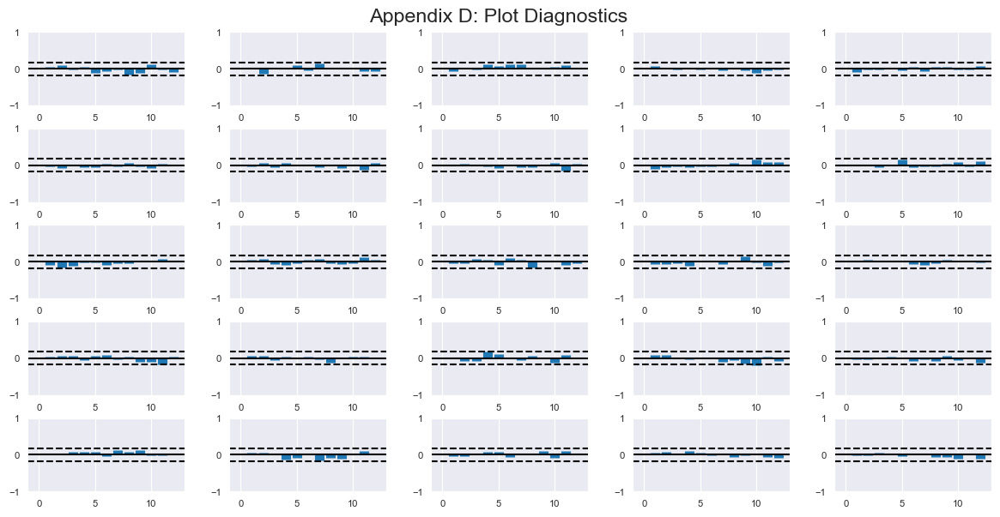

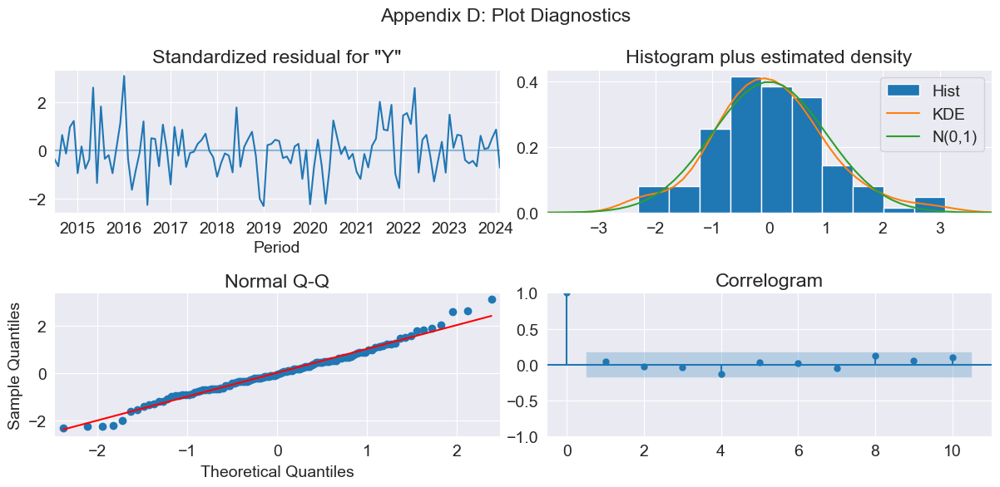

In [74]:
create_forecast_report({'PRY_0402': pry[top]}, [], var_model, log_transform = False, walkforward = False)
create_forecast_report({'PRY_0402': pry[top]}, [], arima, log_transform = False, walkforward = False)